In [1]:
import os

import cv2

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from glob import glob

np.random.seed(42)

# Load Datasets

In [2]:
DATASET_DIR = "../datasets/CCBIS-DDSM/"

In [3]:
train_df = pd.read_csv(os.path.join(DATASET_DIR, "train.csv"))
validation_df = pd.read_csv(os.path.join(DATASET_DIR, "validation.csv"))
test_df = pd.read_csv(os.path.join(DATASET_DIR, "test.csv"))

# Visualize Resulting Images

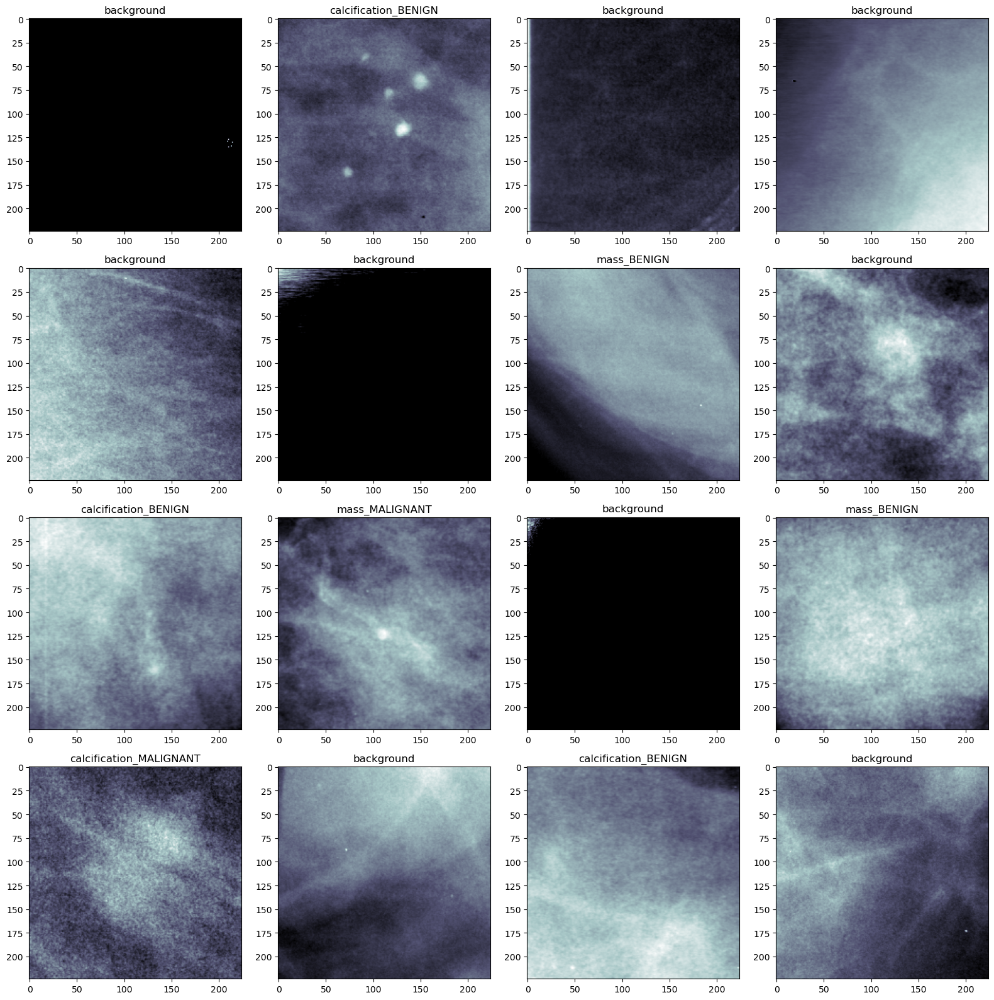

In [4]:
files = [y for x in os.walk("../datasets/S1/") for y in glob(os.path.join(x[0], "*.png"))]
np.random.shuffle(files)
fig = plt.figure(figsize=(16, 16))
for i in range(16):
    ax = fig.add_subplot(4, 4, i+1)
    plt.imshow(Image.open(files[i]), cmap="bone")
    plt.title(files[i].split("/")[4])
plt.tight_layout()
plt.show()

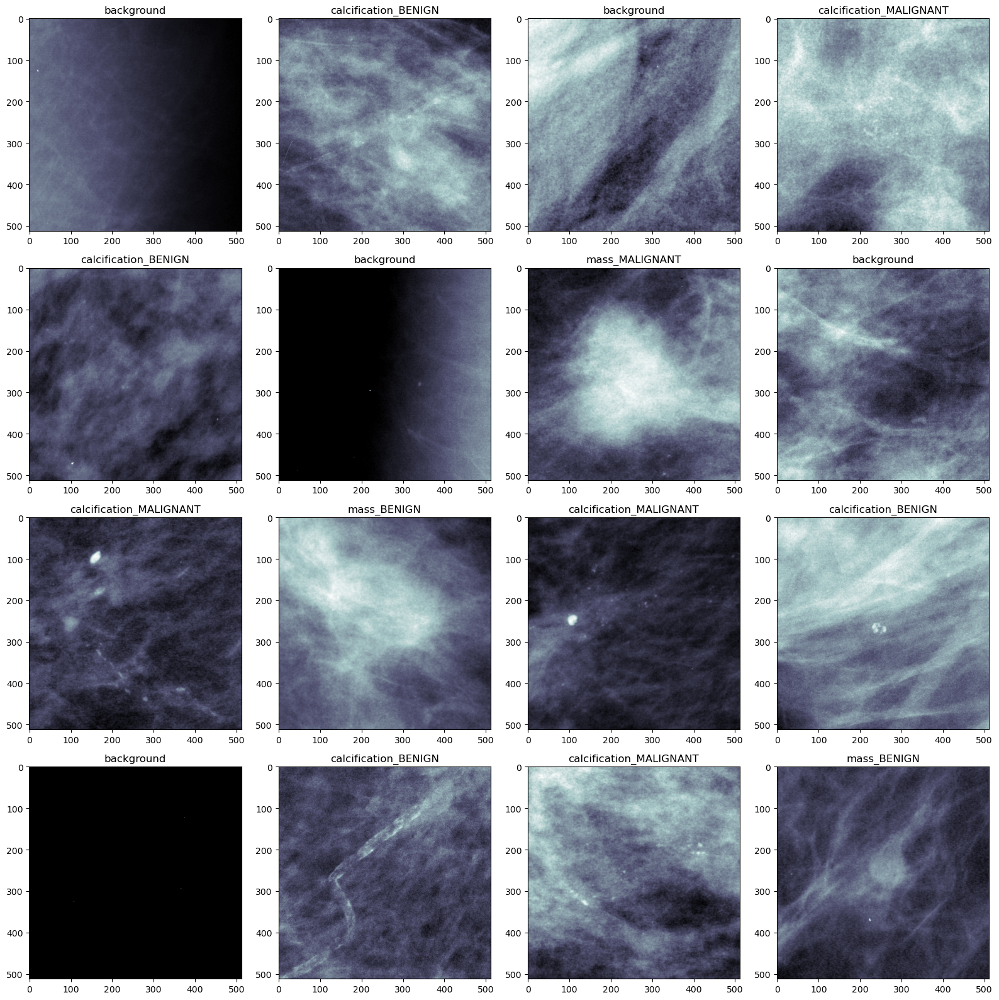

In [5]:
files = [y for x in os.walk("../datasets/S1-Big/") for y in glob(os.path.join(x[0], "*.png"))]
np.random.shuffle(files)
fig = plt.figure(figsize=(16, 16))
for i in range(16):
    ax = fig.add_subplot(4, 4, i+1)
    plt.imshow(Image.open(files[i]), cmap="bone")
    plt.title(files[i].split("/")[4])
plt.tight_layout()
plt.show()

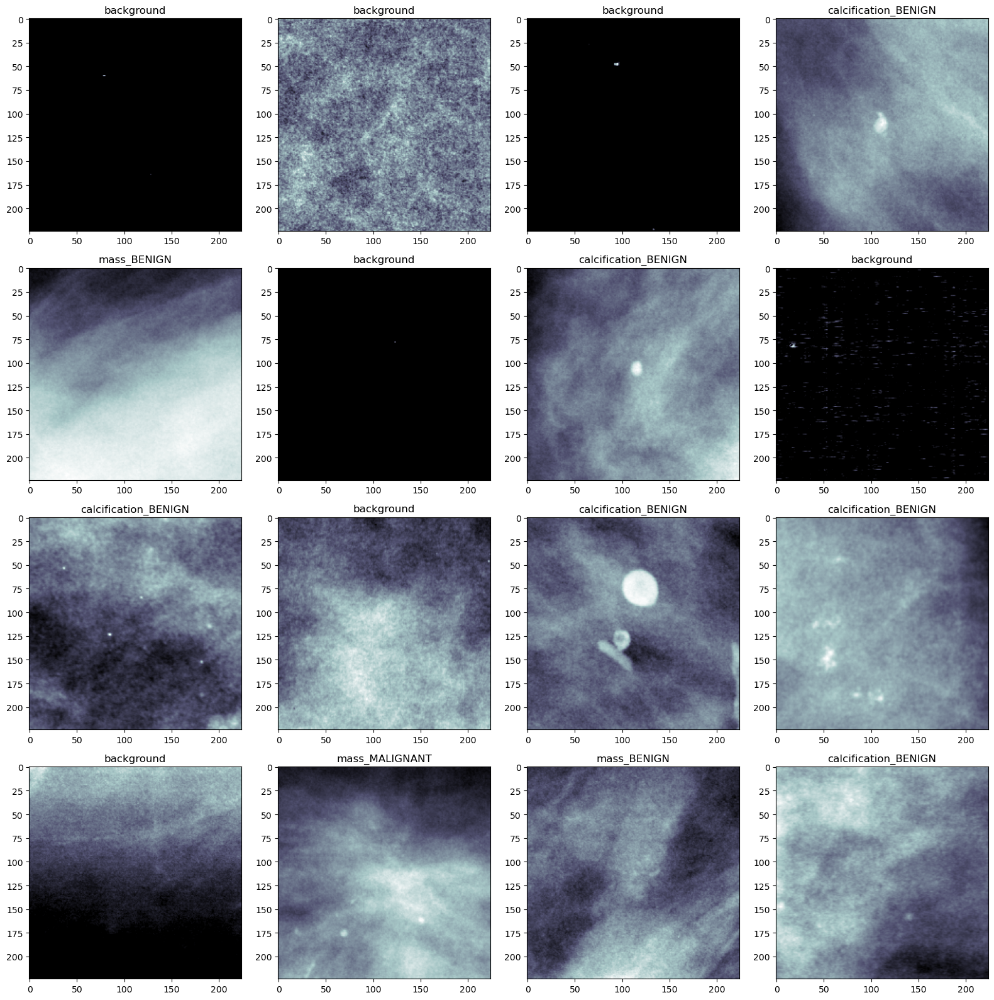

In [6]:
files = [y for x in os.walk("../datasets/S10/") for y in glob(os.path.join(x[0], "*.png"))]
np.random.shuffle(files)
fig = plt.figure(figsize=(16, 16))
for i in range(16):
    ax = fig.add_subplot(4, 4, i+1)
    plt.imshow(Image.open(files[i]), cmap="bone")
    plt.title(files[i].split("/")[4])
plt.tight_layout()
plt.show()

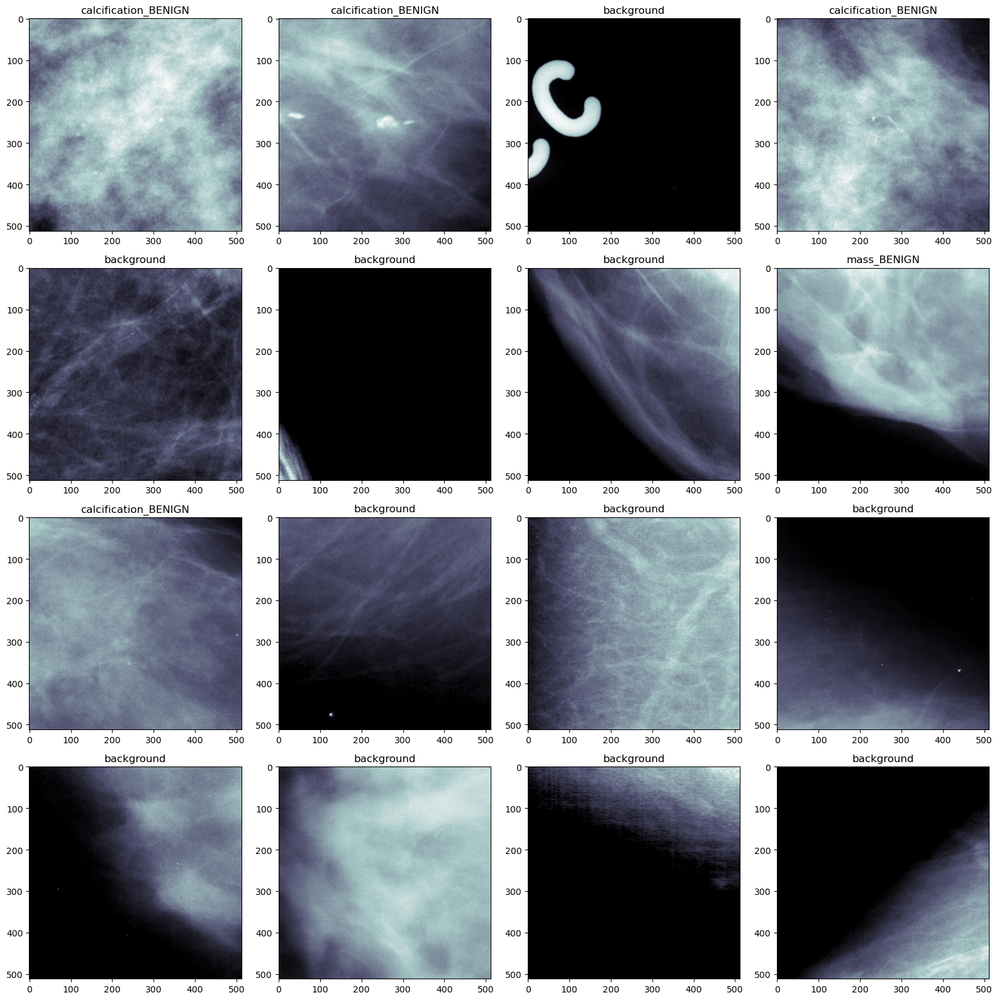

In [7]:
files = [y for x in os.walk("../datasets/S10-Big/") for y in glob(os.path.join(x[0], "*.png"))]
np.random.shuffle(files)
fig = plt.figure(figsize=(16, 16))
for i in range(16):
    ax = fig.add_subplot(4, 4, i+1)
    plt.imshow(Image.open(files[i]), cmap="bone")
    plt.title(files[i].split("/")[4])
plt.tight_layout()
plt.show()

# Visualizing Patches on Mammographies

In [8]:
def overlap(bbox_a, bbox_b):
    """
    Checks for overlap between two bounding boxes
    Boxes must be in x, y, w, h format
    """
    x1 = max(bbox_a[0], bbox_b[0])
    x2 = min(bbox_a[0] + bbox_a[2], bbox_b[0] + bbox_b[2])
    y1 = max(bbox_a[1], bbox_b[1])
    y2 = min(bbox_a[1] + bbox_a[3], bbox_b[1] + bbox_b[3])
    
    area = max(0, x2-x1+1) * max(0, y2-y1+1)
    return area

def get_patch_location_random(bbox, image_shape):
    """
    Gets the patch starting points for a lession in the image.
    Puts the starting point at a random location such that the patch area selected is random inside the lession
    """
    # Unpack bbox
    x, y, w, h = bbox
    
    # There are two possibilities:
    # 1. The lession is smaller than the patch size:
    #      In this case, we will center the patch on the lession and then slightly move the patch with a random offset
    # 2. The lession is bigger than the patch size:
    #      In this case, we will just choose a randomly selected starting point for the patch inside the bounding box
    
    # Case 1
    if(w <= PATCH_WIDTH):
        patch_x = np.random.randint(x + (w/2) - (PATCH_WIDTH/2) - 10, x + (w/2) - (PATCH_WIDTH/2) + 10)
    if(h <= PATCH_HEIGHT):
        patch_y = np.random.randint(y + (h/2) - (PATCH_HEIGHT/2) - 10, y + (h/2) - (PATCH_HEIGHT/2) + 10)
    
    # Case 2
    if(w > PATCH_WIDTH):
        patch_x = np.random.randint(x - 10, x + w - PATCH_WIDTH + 10)
    if(h > PATCH_WIDTH):
        patch_y = np.random.randint(y - 10, y + h - PATCH_HEIGHT + 10)
    
    # Ensure they are all inside the image
    if patch_x < 0: patch_x = 0
    if patch_x + PATCH_WIDTH > image_shape[1]: patch_x = image_shape[1] - PATCH_WIDTH
    if patch_y < 0: patch_y = 0
    if patch_y + PATCH_HEIGHT > image_shape[0]: patch_y = image_shape[0] - PATCH_HEIGHT
    
    return int(patch_x), int(patch_y)

def get_background_location(bboxes, image_shape):
    """
    Get the patch starting points for the background patches in the image
    Selects background from places where there are no lessions
    """
    while(True):
        # Get a random value for the background starting point
        bg_x = np.random.randint(image_shape[1] - PATCH_WIDTH)
        bg_y = np.random.randint(image_shape[0] - PATCH_HEIGHT)
        
        # Counter to ensure all bounding boxes don't collide with the background class
        i = 0
        for bbox in bboxes:
            # Unpack values
            x, y, w, h = bbox
            # Check that the starting point is not inside any bounding box
            if overlap(bbox, [bg_x, bg_y, PATCH_WIDTH, PATCH_HEIGHT]) == 0:
                i = i+1
        
        # If i is the same as the number of boxes, it means the background doesn't collide with any bbox
        # So we can use it.
        if(i == len(bboxes)):
            return int(bg_x), int(bg_y)

In [9]:
def get_points(path):
    image = np.array(Image.open(os.path.join(DATASET_DIR + path)))
    tmp_df = train_df[train_df["Image"] == path]
    bboxes = np.array(tmp_df.iloc[:, -4:].values)

    patches = []
    for bbox in bboxes:
        for i in range(NUM_PATCHES):
            x, y = get_patch_location_random(bbox, image.shape)
            patches.append([x, y])
    backgrounds = []
    for i in range(len(bboxes)):
        for j in range(NUM_PATCHES):
            background = [0]
            # Iterate over different backgrounds until we have one that has useful information (isn't just black)
            while(np.amax(background) == 0):
                x, y = get_background_location(bboxes, image.shape)
                background = image[y:y+PATCH_HEIGHT, x:x+PATCH_WIDTH]
            backgrounds.append([x, y])
    return patches, backgrounds

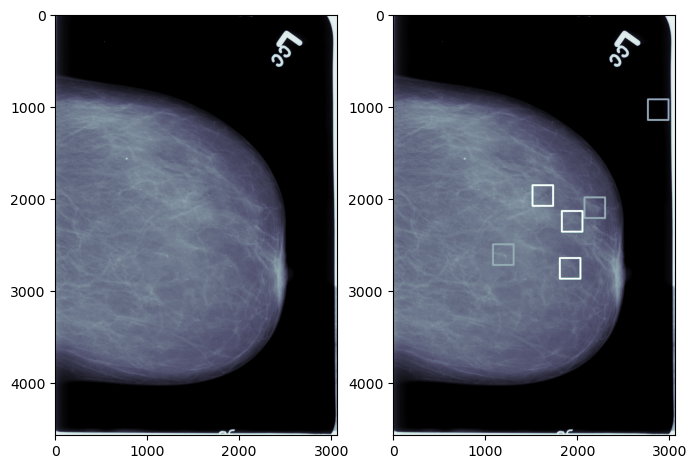

In [10]:
PATCH_WIDTH = 224
PATCH_HEIGHT = 224
NUM_PATCHES = 1

patches, backgrounds = get_points("train/images/Calc_P_00008_LEFT_CC.png")
fig, ax = plt.subplots(1, 2, figsize=(8, 16))
image = np.array(Image.open(os.path.join(DATASET_DIR + "train/images/Calc_P_00008_LEFT_CC.png")))
ax[0].imshow(image, cmap="bone")
for point in patches:
    cv2.rectangle(image, point, (point[0] + PATCH_WIDTH, point[1] + PATCH_HEIGHT), 255, 20)
for point in backgrounds:
    cv2.rectangle(image, point, (point[0] + PATCH_WIDTH, point[1] + PATCH_HEIGHT), 170, 20)
ax[1].imshow(image, cmap="bone")

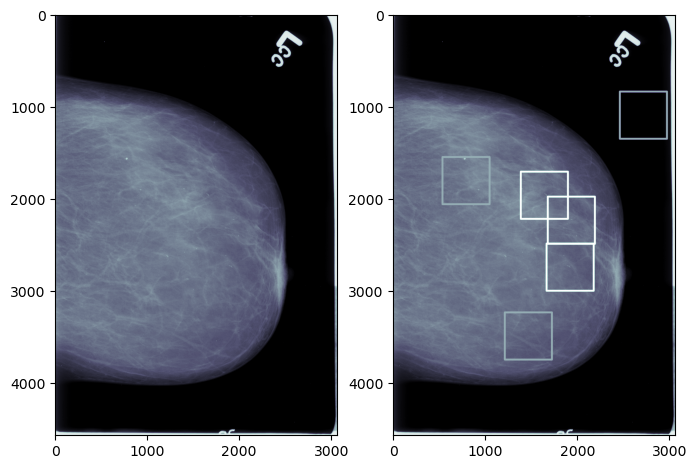

In [11]:
PATCH_WIDTH = 512
PATCH_HEIGHT = 512
NUM_PATCHES = 1

patches, backgrounds = get_points("train/images/Calc_P_00008_LEFT_CC.png")
fig, ax = plt.subplots(1, 2, figsize=(8, 16))
image = np.array(Image.open(os.path.join(DATASET_DIR + "train/images/Calc_P_00008_LEFT_CC.png")))
ax[0].imshow(image, cmap="bone")
for point in patches:
    cv2.rectangle(image, point, (point[0] + PATCH_WIDTH, point[1] + PATCH_HEIGHT), 255, 20)
for point in backgrounds:
    cv2.rectangle(image, point, (point[0] + PATCH_WIDTH, point[1] + PATCH_HEIGHT), 170, 20)
ax[1].imshow(image, cmap="bone")

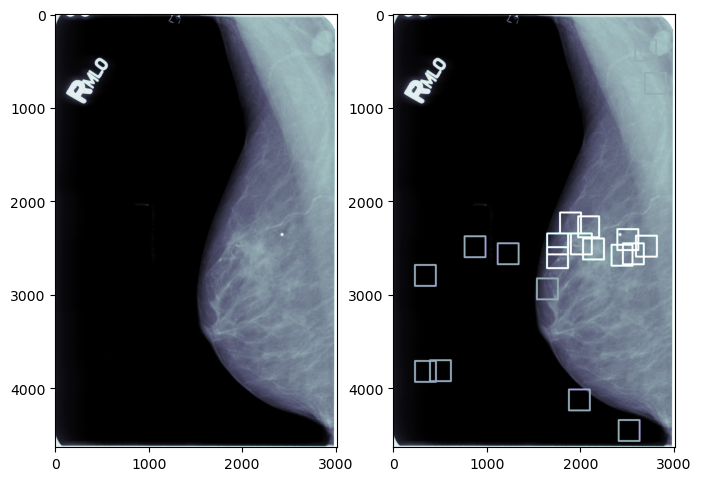

In [12]:
PATCH_WIDTH = 224
PATCH_HEIGHT = 224
NUM_PATCHES = 10

patches, backgrounds = get_points("train/images/Calc_P_00030_RIGHT_MLO.png")
fig, ax = plt.subplots(1, 2, figsize=(8, 16))
image = np.array(Image.open(os.path.join(DATASET_DIR + "train/images/Calc_P_00030_RIGHT_MLO.png")))
ax[0].imshow(image, cmap="bone")
for point in patches:
    cv2.rectangle(image, point, (point[0] + PATCH_WIDTH, point[1] + PATCH_HEIGHT), 255, 20)
for point in backgrounds:
    cv2.rectangle(image, point, (point[0] + PATCH_WIDTH, point[1] + PATCH_HEIGHT), 170, 20)
ax[1].imshow(image, cmap="bone")